# Dataframe of Planetary System Data from INARA

Importing modules

In [163]:
import pandas as pd
import scipy as sp
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import joblib

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures, FunctionTransformer 
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error

import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

import astropy.constants as const

Unit conversions

In [164]:
Erg_to_J = 10**-7    # J per erg
cm2_to_m2 = 1/(100**2)  # m2 per cm2
parsec_to_m = 30856775814913673   # m per parsec
SolarRadii_to_m = 6.957*(10**8) # m per solar radii
AU_to_m = 149597870700 # m per AU

Function to generate Pressure-Temperature Profile. Taken from Frontier Development Labs Python code used to create the INARA dataset. The models used in these functions taken from Line et al. (2013)

In [165]:
def xi(gamma, tau):
    return (2.0/3) * (1 + (1/gamma) * (1 + (0.5*gamma*tau-1)*np.exp(-gamma*tau)) +
                        gamma*(1 - 0.5*tau**2) * sp.special.expn(2, gamma*tau)             )    

def PT_line(pressure, params, R_star, T_star, T_int, sma, grav):
    kappa  = 10**(params[0])
    gamma1 = 10**(params[1])
    gamma2 = 10**(params[2])
    alpha, beta = params[3], params[4]

    # Stellar input temperature (at top of atmosphere):
    T_irr = beta * (R_star / (2.0*sma))**0.5 * T_star

    # Gray IR optical depth:
    tau = kappa * (pressure*1e6) / grav # Convert bars to barye (CGS)

    xi1 = xi(gamma1, tau)
    xi2 = xi(gamma2, tau)

    # Temperature profile (Eq. 13 of Line et al. 2013):
    temperature = (0.75 * (T_int**4 * (2.0/3.0 + tau) +
                             T_irr**4 * (1-alpha) * xi1 +
                             T_irr**4 * alpha     * xi2 ) )**0.25

    return temperature

## Ingesting the planetary dataset

In [166]:
df = pd.read_csv('../../../Raw Data/Large Validation Data/Dataset 1/psg_models.csv', index_col = 'PlanetIndex', dtype = {'PlanetIndex': str})

## Calculating Stellar and Planetary Signals for each Planet System

The spectral data provided by the INARA dataset is in (erg/s/cm2) and not per micron. The signals are thus likely the intensity of a given bin of wavelengths. These values thus only need to be summed together and not integrated.

In [167]:
for Planet in df.index:
    FileName = Planet + '.csv'
    Spectral_Data = pd.read_csv('../../../Raw Data/Large Validation Data/Dataset 1/Spectra/' + FileName, usecols = ['wavelength_(um)', 'stellar_signal_(erg/s/cm2)', 'planet_signal_(erg/s/cm2)'])

    Spectral_Data['stellar_signal_(erg/s/cm2)'][0:4378] = Spectral_Data['stellar_signal_(erg/s/cm2)'][0:4378]*(10**10)

    Bolometric_Stellar_Signal = sum(Spectral_Data['stellar_signal_(erg/s/cm2)'].values)
    Bolometric_Stellar_Signal = Bolometric_Stellar_Signal*Erg_to_J*(1/cm2_to_m2)                # Stellar flux as experienced on Earth
    Bolometric_Planet_Signal = sum(Spectral_Data['planet_signal_(erg/s/cm2)'].values)
    Bolometric_Planet_Signal = Bolometric_Planet_Signal*Erg_to_J*(1/cm2_to_m2)                  # Planetary flux as experienced on Earth

    df.loc[Planet, 'Bolometric Stellar Signal (W/m2)'] = Bolometric_Stellar_Signal
    df.loc[Planet, 'Bolometric Planet Signal (W/m2)'] = Bolometric_Planet_Signal 

    SA_Star = 4*(np.pi)*((df.loc[Planet, 'star_radius_in_Solar_radii']*SolarRadii_to_m)**2)     # Surface Area of star
    d = df.loc[Planet, 'distance_from_Earth_to_the_system_in_parsecs']*parsec_to_m + df.loc[Planet, 'semimajor_axis_of_the_planet_in_AU']*AU_to_m + df.loc[Planet, 'planet_radius_in_km']*1000*2    # distance from telescope to surface of star (assuming earth, planet and star are directly in line with one another)
    df.loc[Planet, 'True Stellar Signal (W/m2)'] = (df.loc[Planet, 'Bolometric Stellar Signal (W/m2)']*(4*np.pi*(d**2)))/SA_Star        # Stellar flux released by the surface of the star

    SA_Planet = 4*(np.pi)*((df.loc[Planet, 'planet_radius_in_km']*1000)**2)                     # Surface Area of planet
    d = df.loc[Planet, 'distance_from_Earth_to_the_system_in_parsecs']*parsec_to_m      # distance from earth to planet
    df.loc[Planet, 'True Planet Signal (W/m2)'] = (df.loc[Planet, 'Bolometric Planet Signal (W/m2)']*(4*np.pi*(d**2))) / SA_Planet                  # Planetary flux released by the surface of the planet

    # generation of Pressure-Temperature Profiles
    P_prof = np.logspace(np.log10(df.loc[Planet, 'planet_surface_pressure_bars']), np.log10(1e-6), 50) # bar

    density = df.loc[Planet, 'planet_density']
    rplanet     = df.loc[Planet, 'planet_radius_in_km']
    mplanet = density *  (4./3. * np.pi * (rplanet * const.R_earth.cgs.value)**3) / const.M_earth.cgs.value
    surfgrav = const.G.cgs.value * mplanet * const.M_earth.cgs.value /  \
                   (rplanet * const.R_earth.cgs.value)**2
    
    T_prof = PT_line(P_prof, [df.loc[Planet, 'kappa'], df.loc[Planet, 'gamma1'], df.loc[Planet, 'gamma2'], df.loc[Planet, 'alpha'], df.loc[Planet, 'beta']], df.loc[Planet, 'star_radius_in_Solar_radii']* const.R_sun.value, df.loc[Planet, 'star_temperature_in_Kelvin'], 0, df.loc[Planet, 'semimajor_axis_of_the_planet_in_AU']* const.au.value, surfgrav) # K

    df.loc[Planet, 'planet_surface_temperature_Kelvin'] = T_prof[0]

C:\Users\henry\AppData\Local\Temp\ipykernel_19848\117911485.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  Spectral_Data['stellar_signal_(erg/s/cm2)'][0:4378] = Spectral_Data['stellar_signal_(erg/s/cm2)'][0:4378]*(10**10)
C:\Users\henry

## Removing Outliers

In [168]:
# SB_const =  5.670374419*(10**-8)
# df['Planet Flux (SB) (W/m2)'] = SB_const*(df['planet_surface_temperature_Kelvin']**4)
# df = df.loc[df['True Planet Signal (W/m2)'] <= 1.1*df['Planet Flux (SB) (W/m2)']] # Removing planets that have OLR's greater than (with a tolerance of 10 %) their blackbodies

# df['Stellar Flux (SB) (W/m2)'] = SB_const*(df['star_temperature_in_Kelvin']**4)
# df = df.loc[df['True Stellar Signal (W/m2)'] <= 1.1*df['Stellar Flux (SB) (W/m2)']] # Removing stars that emit radiation greater than (with a tolerance of 10 %) their blackbodies
# df.describe().T

Assumptions:

    No losses of electromagnetic energy from the star/planet to earth.
        Thus the electromangetic radiation experienced per m2 on earth is inversely proportional to 4*pi*d^2

# Development of Regression Models

## Engineering Vairables

In [169]:
# Partial Pressures of gasses
df['pH2O (bar)'] = df['planet_surface_pressure_bars']*df['H2O']
df['pCO2 (bar)'] = df['planet_surface_pressure_bars']*df['CO2']
df['pO2 (bar)'] = df['planet_surface_pressure_bars']*df['O2']
df['pN2 (bar)'] = df['planet_surface_pressure_bars']*df['N2']
df['pCH4 (bar)'] = df['planet_surface_pressure_bars']*df['CH4']
df['pN2O (bar)'] = df['planet_surface_pressure_bars']*df['N2O']
df['pCO (bar)'] = df['planet_surface_pressure_bars']*df['CO']
df['pO3 (bar)'] = df['planet_surface_pressure_bars']*df['O3']
df['pSO2 (bar)'] = df['planet_surface_pressure_bars']*df['SO2']
df['pNH3 (bar)'] = df['planet_surface_pressure_bars']*df['NH3']
df['pC2H6 (bar)'] = df['planet_surface_pressure_bars']*df['C2H6']
df['pNO2 (bar)'] = df['planet_surface_pressure_bars']*df['NO2']

# Effective Blackbody Temperature
SB_const =  5.670374419*(10**(-8)) 
df['BB OLR (W/m2)'] = SB_const*((df['planet_surface_temperature_Kelvin'])**4)

# Emissivity of planet surface
df['Mean Surface Emissivity'] = 1 - df['planets_mean_surface_albedo']

# Greybody OLR emitted
df['GB OLR (W/m2)'] = df['BB OLR (W/m2)'] = df['Mean Surface Emissivity']*SB_const*((df['planet_surface_temperature_Kelvin'])**4)

## Multiple Regression Models for OLR

In [170]:
# Data
# Output data
Y = df['True Planet Signal (W/m2)']
Y_Train, Y_Valid = train_test_split(Y, test_size= 0.1, shuffle= False)

#Input data
X_vars = ['planet_surface_temperature_Kelvin', 'BB OLR (W/m2)', 'pH2O (bar)', 'pCO2 (bar)', 'pO2 (bar)', 'pN2 (bar)', 'pCH4 (bar)', 'pN2O (bar)', 'pCO (bar)', 'pO3 (bar)', 'pSO2 (bar)', 'pNH3 (bar)', 'pC2H6 (bar)', 'pNO2 (bar)', 'GB OLR (W/m2)']
X_all = df[X_vars]

### Polynomial Combinations and log

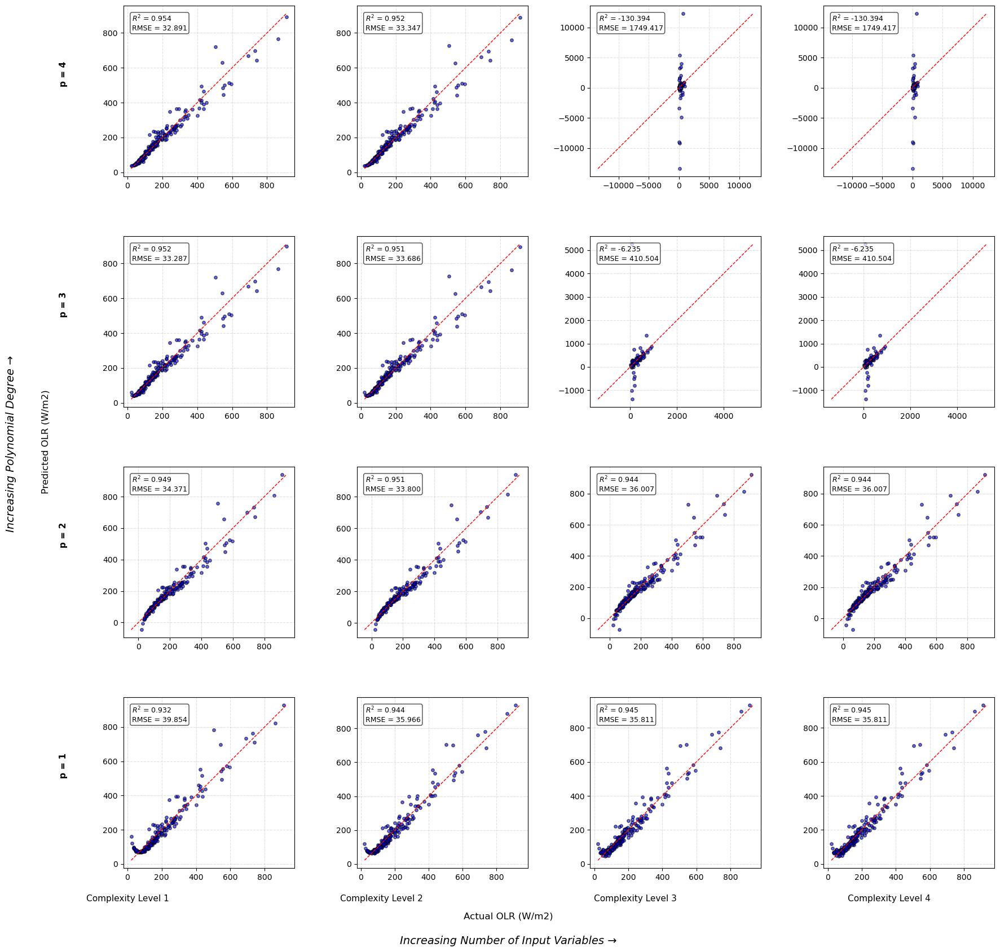

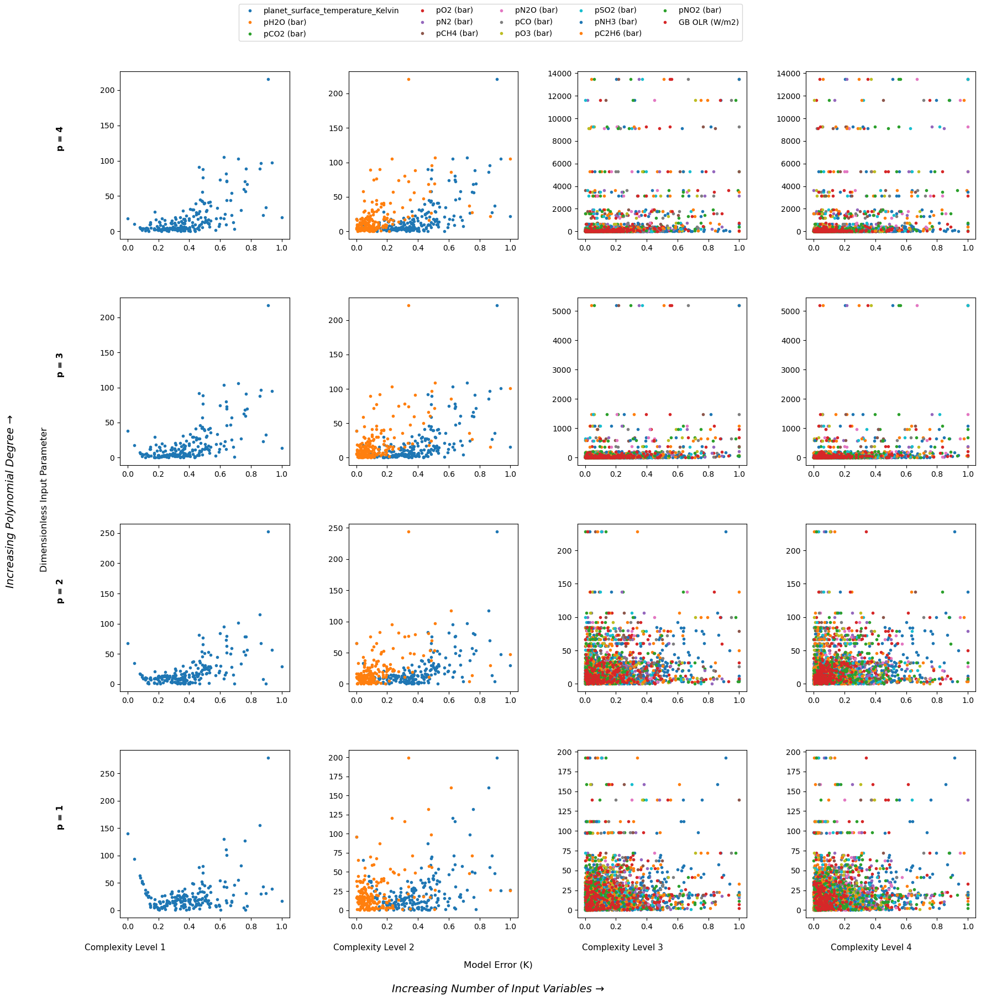

In [171]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        if i == 0:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias = False), X_subset),

                # log10 
                ('log', FunctionTransformer(np.log10, validate = False), X_subset),

                # Don't transform
                # ('linear', 'passthrough', ['BB OLR (W/m2)'])
            ]) 
        elif i >= 1 and i < 14:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias = False), X_subset[:1] + X_subset[2:]),

                # log10 
                ('log', FunctionTransformer(np.log10, validate = False), X_subset[:1] + X_subset[2:]),

                # Don't transform
                ('linear', 'passthrough', ['BB OLR (W/m2)'])
            ])             
        else:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset[:len(X_subset) - 1]),

                # log10 
                ('log', FunctionTransformer(np.log10, validate= False), X_subset[:len(X_subset) - 1]),

                # Don't transform
                ('linear', 'passthrough', ['GB OLR (W/m2)'])
            ])                       
               
        # Linear Regression Model
        LR = Pipeline([
            ('features', transformer),
            ('regressor', LinearRegression())
        ])

        # Fitting the model to the data
        LR.fit(X_Train, Y_Train)

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)
        Rsqr = r2_score(Y_Valid, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid, Y_Valid_Pred))

        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid),
        'R²': Rsqr,
        'RMSE': RMSE
        })

# Parity Plots =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Polynomial Combinations and Logs", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Polynomial Combinations and Logs")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')

    #ax.legend()

fig.subplots_adjust(left=0.12, right=0.98, top=0.93,
                    bottom=0.25,                    
                    wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Model Error (K)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Dimensionless Input Parameter", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()


### Just Logs

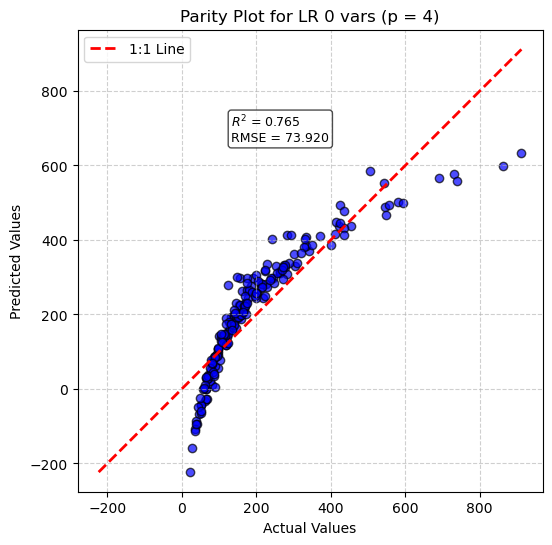

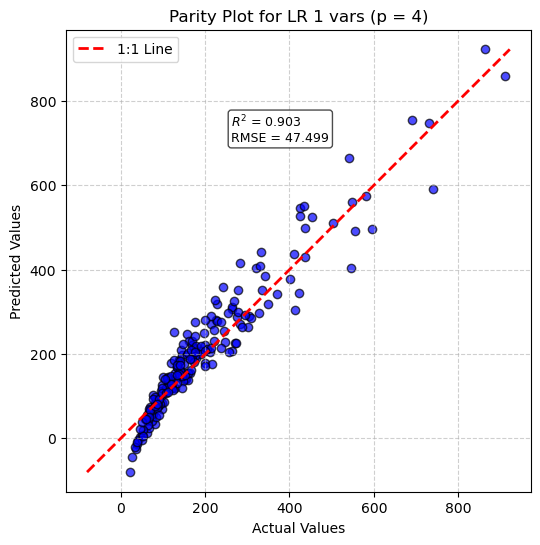

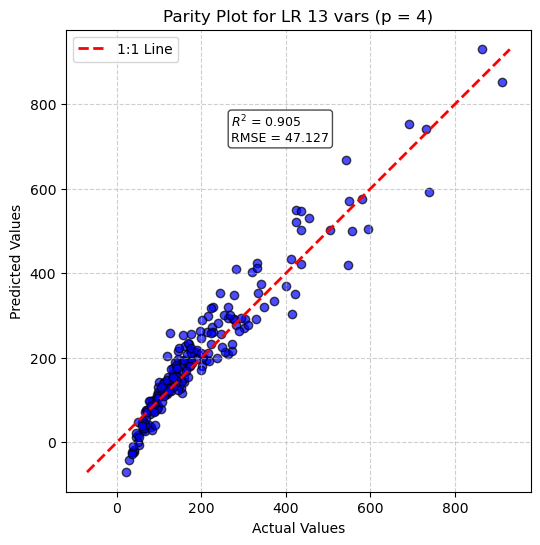

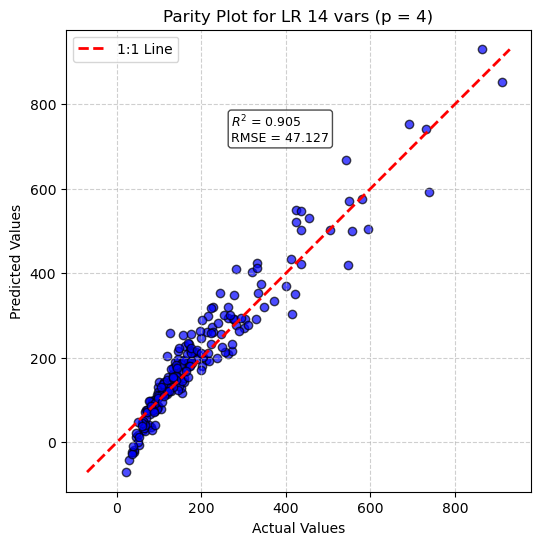

In [172]:
X_subset = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    # Transformation of input
    if i == 0:
        transformer = ColumnTransformer([
            # Polynomial expansion
            # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

            # log10 
            ('log', FunctionTransformer(np.log10, validate = False), X_subset),

            # Don't transform
            # ('linear', 'passthrough', ['BB OLR (W/m2)'])
        ]) 
    elif i >= 1 and i < 14:
        transformer = ColumnTransformer([
            # Polynomial expansion
            # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

            # log10 
            ('log', FunctionTransformer(np.log10, validate = False), X_subset[:1] + X_subset[2:]),

            # Don't transform
            ('linear', 'passthrough', ['BB OLR (W/m2)'])
        ])             
    else:
        transformer = ColumnTransformer([
            # Polynomial expansion
            # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

            # log10 
            ('log', FunctionTransformer(np.log10, validate = False), X_subset[:len(X_subset) - 1]),

            # Don't transform
            ('linear', 'passthrough', ['GB OLR (W/m2)'])
        ])                       
            
    # Linear Regression Model
    LR = Pipeline([
        ('features', transformer),
        ('regressor', LinearRegression())
    ])

    # Fitting the model to the data
    LR.fit(X_Train, Y_Train)

    # Validating the model
    Y_Valid_Pred = LR.predict(X_Valid)
    Rsqr = r2_score(Y_Valid, Y_Valid_Pred)
    RMSE = np.sqrt(mean_squared_error(Y_Valid, Y_Valid_Pred))

    plt.figure(figsize=(6,6))
    plt.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.7)

    min_val = min(Y_Valid_Pred.min(), Y_Valid.min())
    max_val = max(Y_Valid_Pred.max(), Y_Valid.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='1:1 Line')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Parity Plot for LR ' + str(i) + ' vars (p = ' + str(p) + ')')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.axis('equal')

    plt.text(
    0.05, 0.95,
    f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
    transform=ax.transAxes,
    fontsize=9,
    verticalalignment='top',
    bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    plt.show() 


### Just polynomial combinations

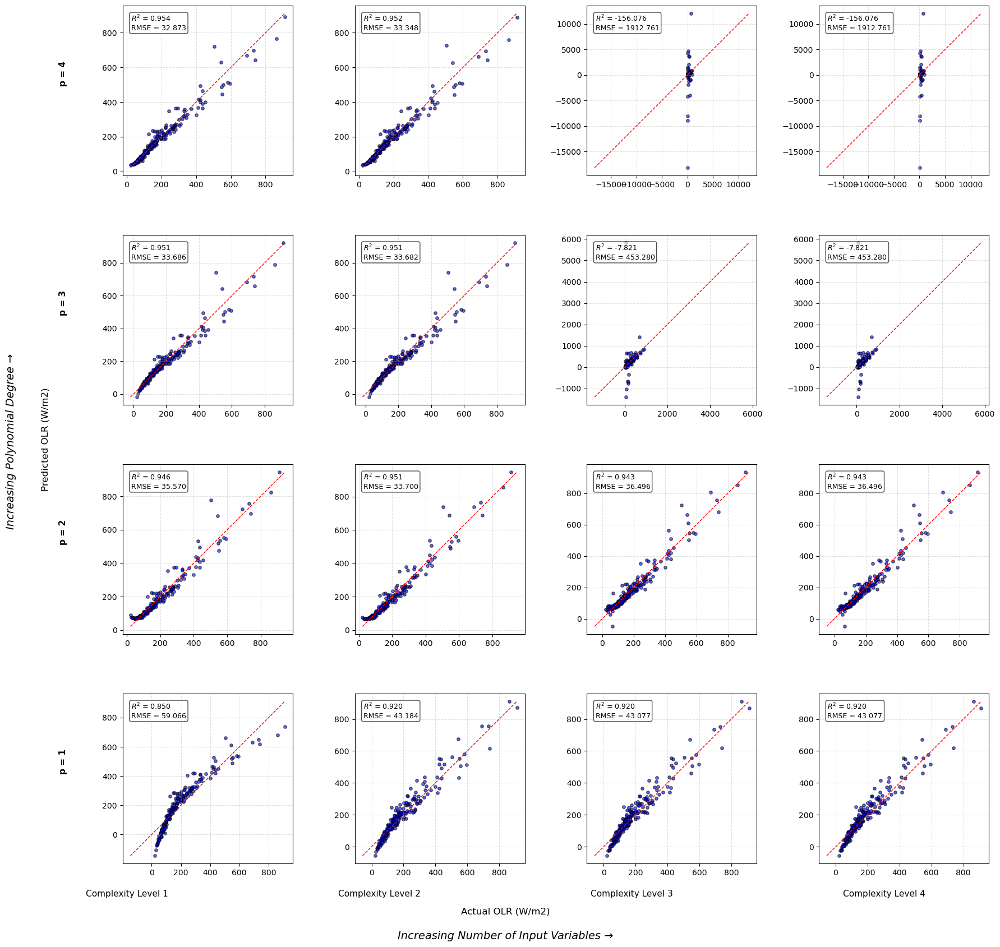

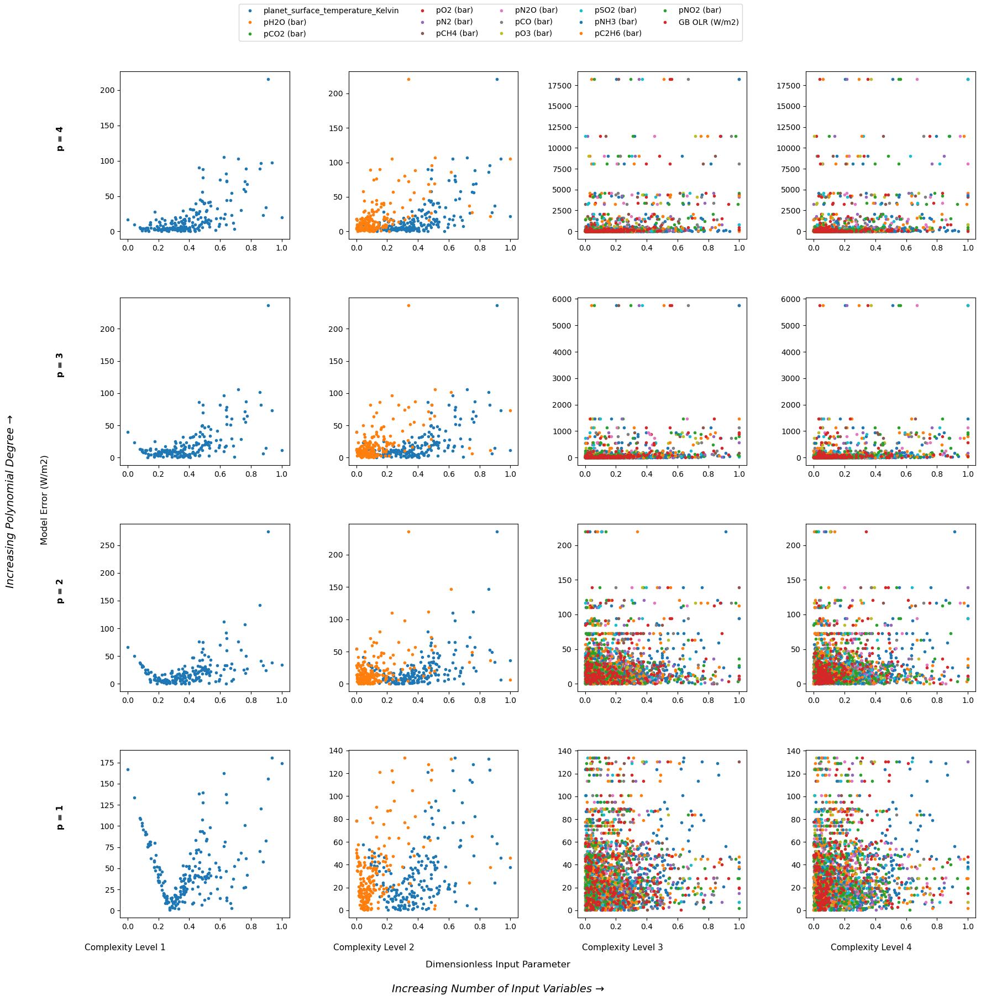

In [173]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        if i == 0:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                # ('linear', 'passthrough', ['BB OLR (W/m2)'])
            ]) 
        elif i >= 1 and i < 14:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset[:1] + X_subset[2:]),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                ('linear', 'passthrough', ['BB OLR (W/m2)'])
            ])             
        else:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset[:len(X_subset) - 1]),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                ('linear', 'passthrough', ['GB OLR (W/m2)'])
            ])                       
               
        # Linear Regression Model
        LR = Pipeline([
            ('features', transformer),
            ('regressor', LinearRegression())
        ])

        # Fitting the model to the data
        LR.fit(X_Train, Y_Train)

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)
        Rsqr = r2_score(Y_Valid, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid, Y_Valid_Pred))


        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid),
        'R²': Rsqr,
        'RMSE': RMSE
        })


# Plotting =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Polynomial Combinations", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Just Polynomial Combinations")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93,bottom=0.25, wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Dimensionless Input Parameter", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Model Error (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

### Polynomial Combinations of logs

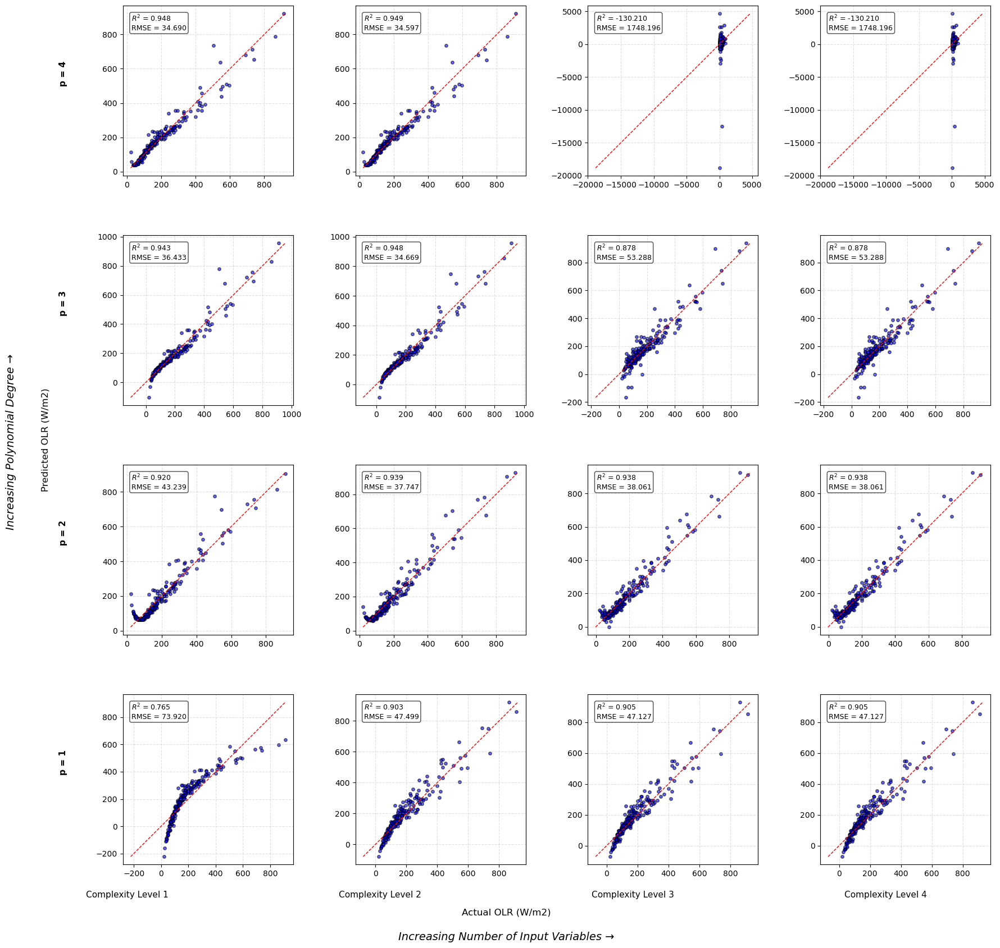

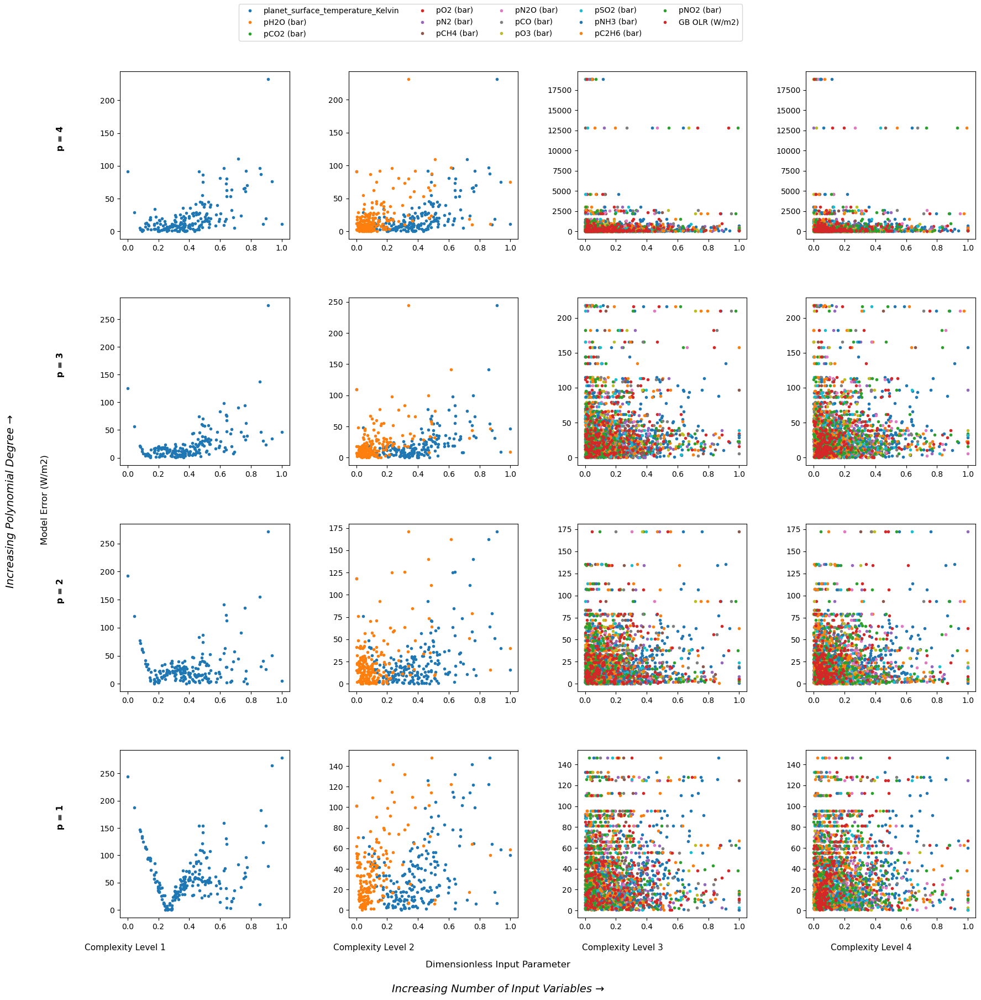

In [174]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        if i == 0:
            transformer = ColumnTransformer([
                # Polynomial expansion
                #('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                # ('linear', 'passthrough', ['BB OLR (W/m2)']),

                # Polynomial expansion of logged variables
                ('PolyLog', Pipeline([
                    ('Log', FunctionTransformer(np.log10, validate = False)),
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False))
                ]), X_subset)
            ]) 
        elif i >= 1 and i < 14:
            transformer = ColumnTransformer([
                # Polynomial expansion
                # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                ('linear', 'passthrough', ['BB OLR (W/m2)']),
                
                # Polynomial expansion of logged variables
                ('PolyLog', Pipeline([
                    ('Log', FunctionTransformer(np.log10, validate = False)),
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False))
                ]), X_subset[:1] + X_subset[2:])
            ])             
        else:
            transformer = ColumnTransformer([
                # Polynomial expansion
                # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                ('linear', 'passthrough', ['GB OLR (W/m2)']),

                # Polynomial expansion of logged variables
                ('PolyLog', Pipeline([
                    ('Log', FunctionTransformer(np.log10, validate = False)),
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False))
                ]), X_subset[:len(X_subset) - 1])
            ])                       
               
        # Linear Regression Model
        LR = Pipeline([
            ('features', transformer),
            ('regressor', LinearRegression())
        ])

        # Fitting the model to the data
        LR.fit(X_Train, Y_Train)

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)
        Rsqr = r2_score(Y_Valid, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid, Y_Valid_Pred))

        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid),
        'R²': Rsqr,
        'RMSE': RMSE
        })

# Plotting =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Polynomial Combinations of Logs", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Polynomial Combinations of Logs")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93,bottom=0.25, wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Dimensionless Input Parameter", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Model Error (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

### Logs of Polynomial Combinations

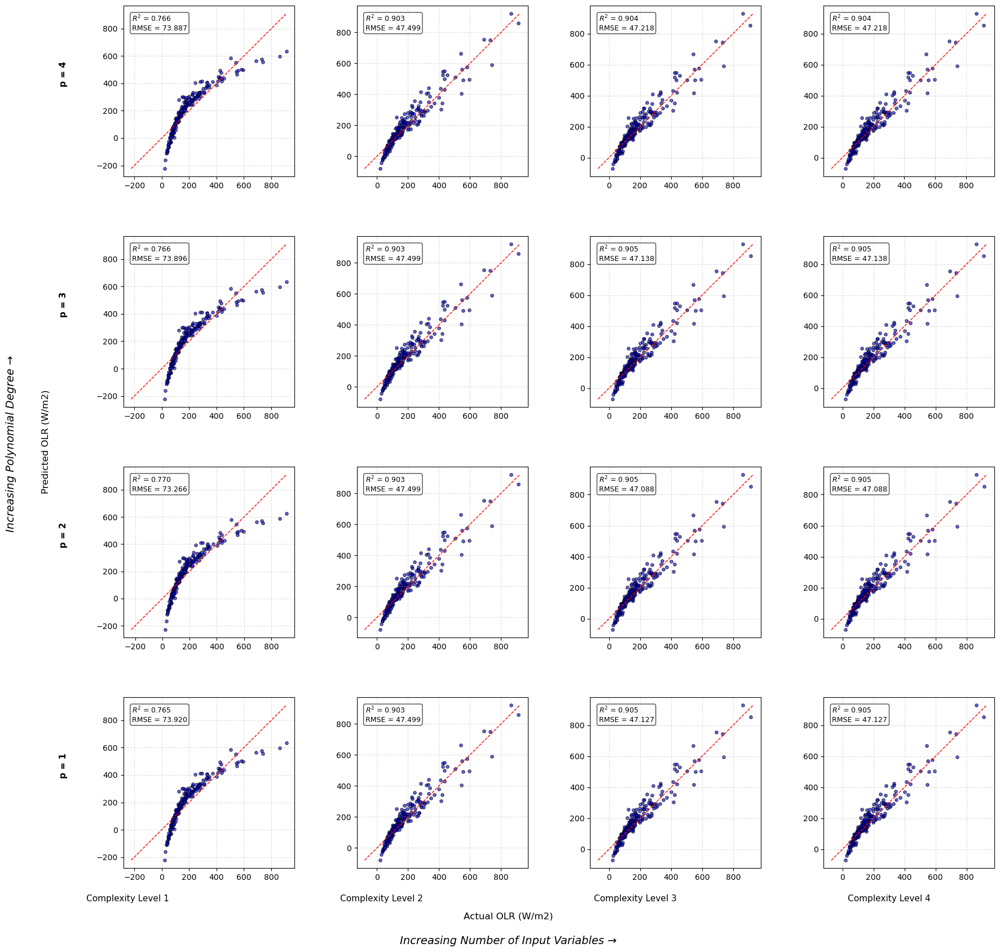

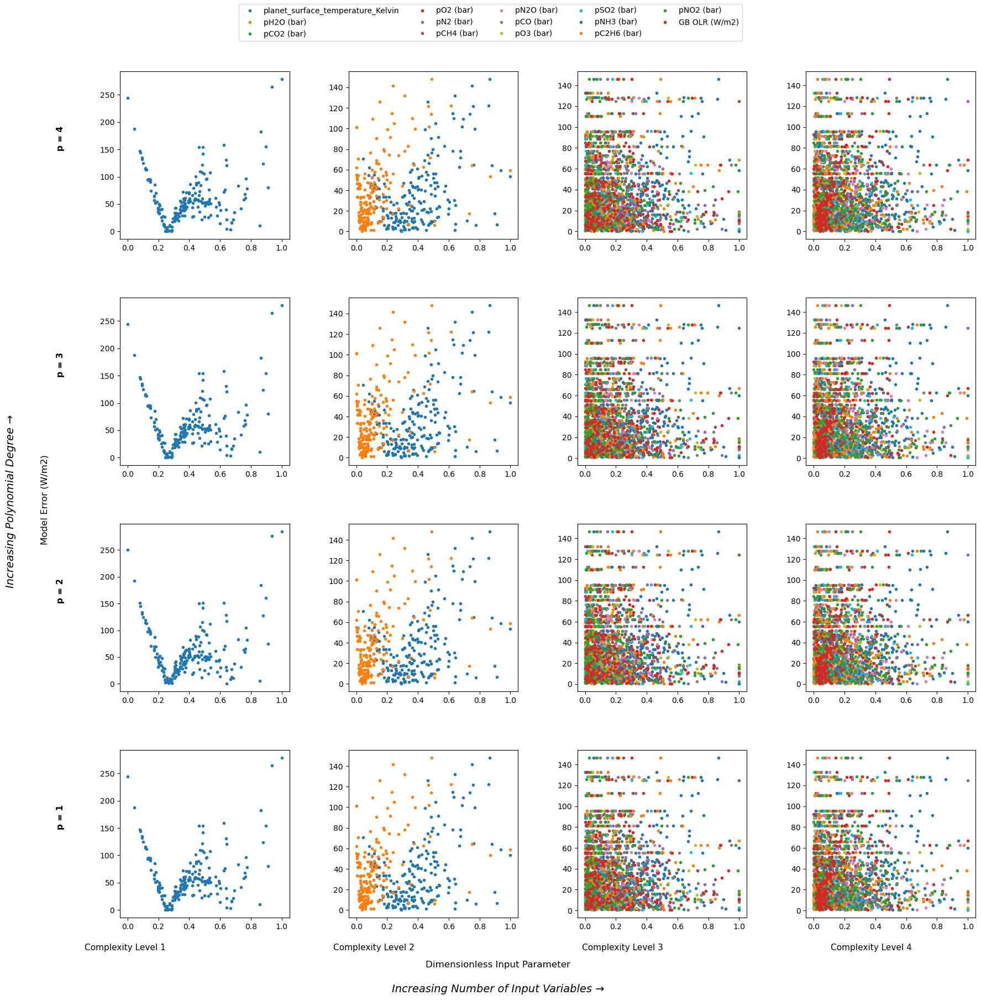

In [175]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        if i == 0:
            transformer = ColumnTransformer([
                # Polynomial expansion
                #('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), ['BB OLR (W/m2)']),

                # Don't transform
                # ('linear', 'passthrough', ['BB OLR (W/m2)']),

                # Logs of Polynomial Expansions
                ('LogPoly', Pipeline([
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False)),
                    ('Log', FunctionTransformer(np.log10, validate = False))
                ]), X_subset)
            ]) 
        elif i >= 1 and i < 14:
            transformer = ColumnTransformer([
                # Polynomial expansion
                # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), ['BB OLR (W/m2)']),

                # Don't transform
                ('linear', 'passthrough', ['BB OLR (W/m2)']),
                
                # Logs of Polynomial Expansions
                ('LogPoly', Pipeline([
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False)),
                    ('Log', FunctionTransformer(np.log10, validate = False))
                ]), X_subset[:1] + X_subset[2:])
            ])             
        else:
            transformer = ColumnTransformer([
                # Polynomial expansion
                # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), ['GB OLR (W/m2)']),

                # Don't transform
                ('linear', 'passthrough', ['GB OLR (W/m2)']),

                # Polynomial expansion of logged variables
                ('LogPoly', Pipeline([
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False)),
                    ('Log', FunctionTransformer(np.log10, validate = False))
                ]), X_subset[:len(X_subset) - 1])
            ])                       
               
        # Linear Regression Model
        LR = Pipeline([
            ('features', transformer),
            ('regressor', LinearRegression())
        ])

        # Fitting the model to the data
        LR.fit(X_Train, Y_Train)

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)

        Rsqr = r2_score(Y_Valid, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid, Y_Valid_Pred))

        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid),
        'R²': Rsqr,
        'RMSE': RMSE
        })


# Plotting =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Logs of Polynomial Combinations", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Polynomial Combinations")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')


fig.subplots_adjust(left=0.12, right=0.98, top=0.93,bottom=0.25, wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Dimensionless Input Parameter", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Model Error (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

### Polynomial Combinations with Negative Powers

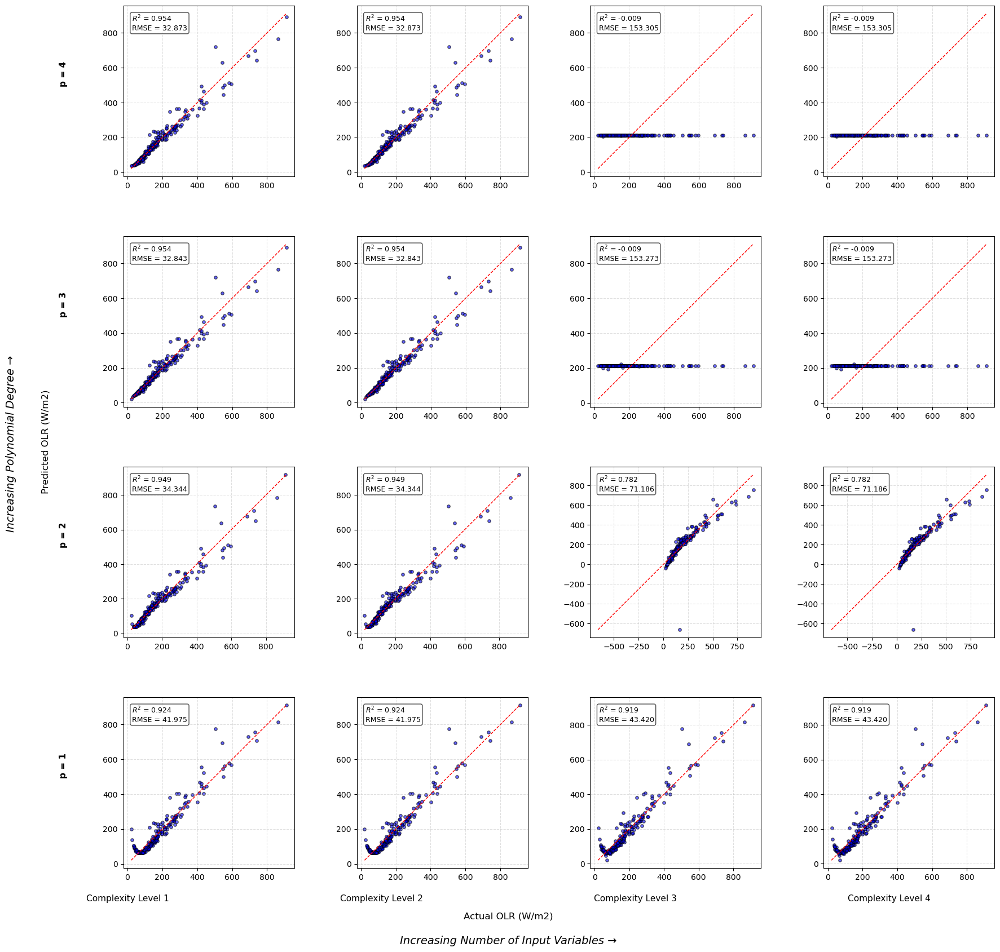

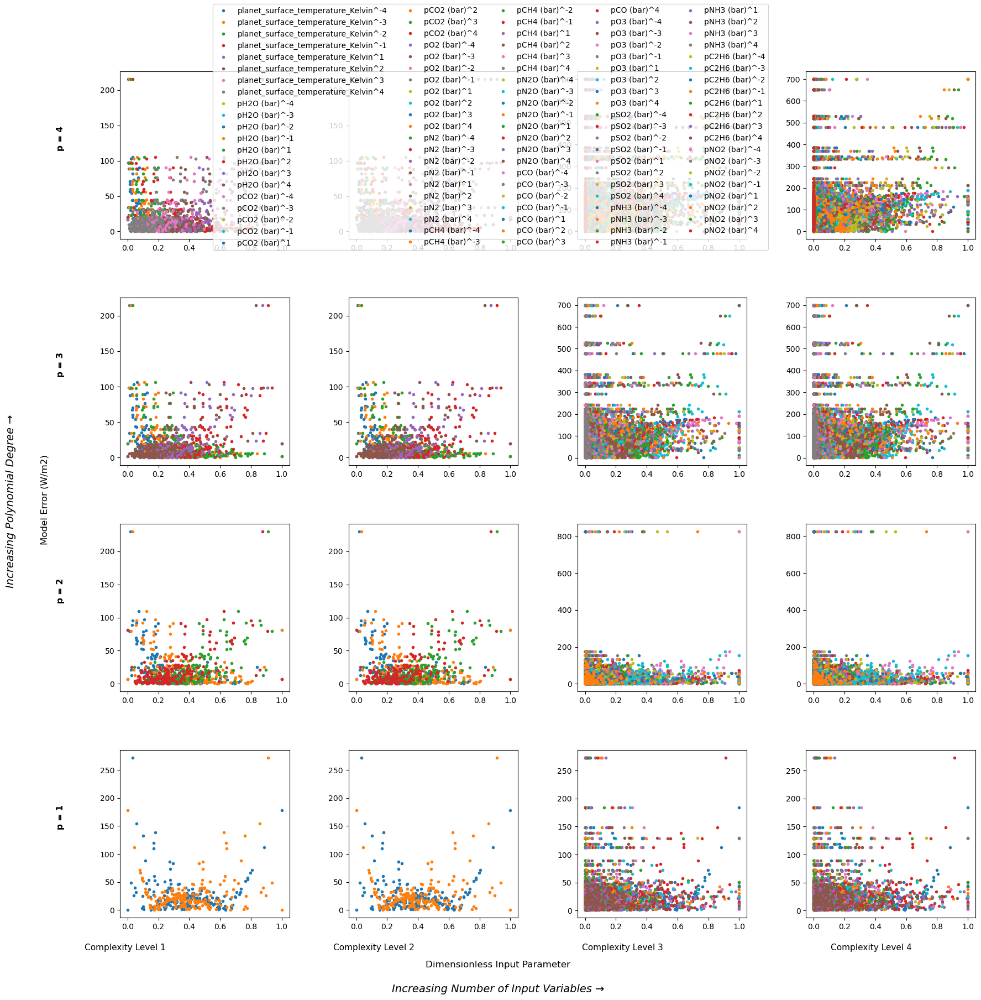

In [176]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    # X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        temp_cols = [c for c in X.columns if "OLR" in c]
        non_temp_cols = [c for c in X.columns if c not in temp_cols]

        X_transformed = pd.concat(
            [X[temp_cols]] + [X[non_temp_cols] ** k for k in range(-p, p + 1) if k != 0],
            axis=1
        )

        X_transformed.columns = (
            temp_cols + [f"{col}^{j}" for col in non_temp_cols for j in range(-p, p + 1) if j != 0]
        )

        X_Train, X_Valid = train_test_split(X_transformed, test_size= 0.1, shuffle= False)

        cols_to_drop = [col for col in X_Train.columns if "OLR" in col and "^1" not in col]
        X_Train = X_Train.drop(columns=cols_to_drop)
        X_Valid = X_Valid.drop(columns=cols_to_drop)

        # Fitting the model to the data
        LR = LinearRegression().fit(X_Train, Y_Train)

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)
        Rsqr = r2_score(Y_Valid, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid, Y_Valid_Pred))

        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid),
        'R²': Rsqr,
        'RMSE': RMSE
        })

# Plotting =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Polynomial Combination with Negative Powers", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Polynomial Combinations with Negative Powers")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93,bottom=0.25, wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Dimensionless Input Parameter", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Model Error (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

## Multiple Regression for LogOLR

In [177]:
# Summary of regression models
# Data
# Output data
Y = np.log10(df['True Planet Signal (W/m2)'])
Y_Train, Y_Valid = train_test_split(Y, test_size= 0.1, shuffle= False)
Y_Valid_T = np.power(10,Y_Valid)        # Untransformed validation OLRs

#Input data
X_vars = ['planet_surface_temperature_Kelvin', 'BB OLR (W/m2)', 'pH2O (bar)', 'pCO2 (bar)', 'pO2 (bar)', 'pN2 (bar)', 'pCH4 (bar)', 'pN2O (bar)', 'pCO (bar)', 'pO3 (bar)', 'pSO2 (bar)', 'pNH3 (bar)', 'pC2H6 (bar)', 'pNO2 (bar)', 'GB OLR (W/m2)']
X_all = df[X_vars]

### Polynomial Combinations and Logs

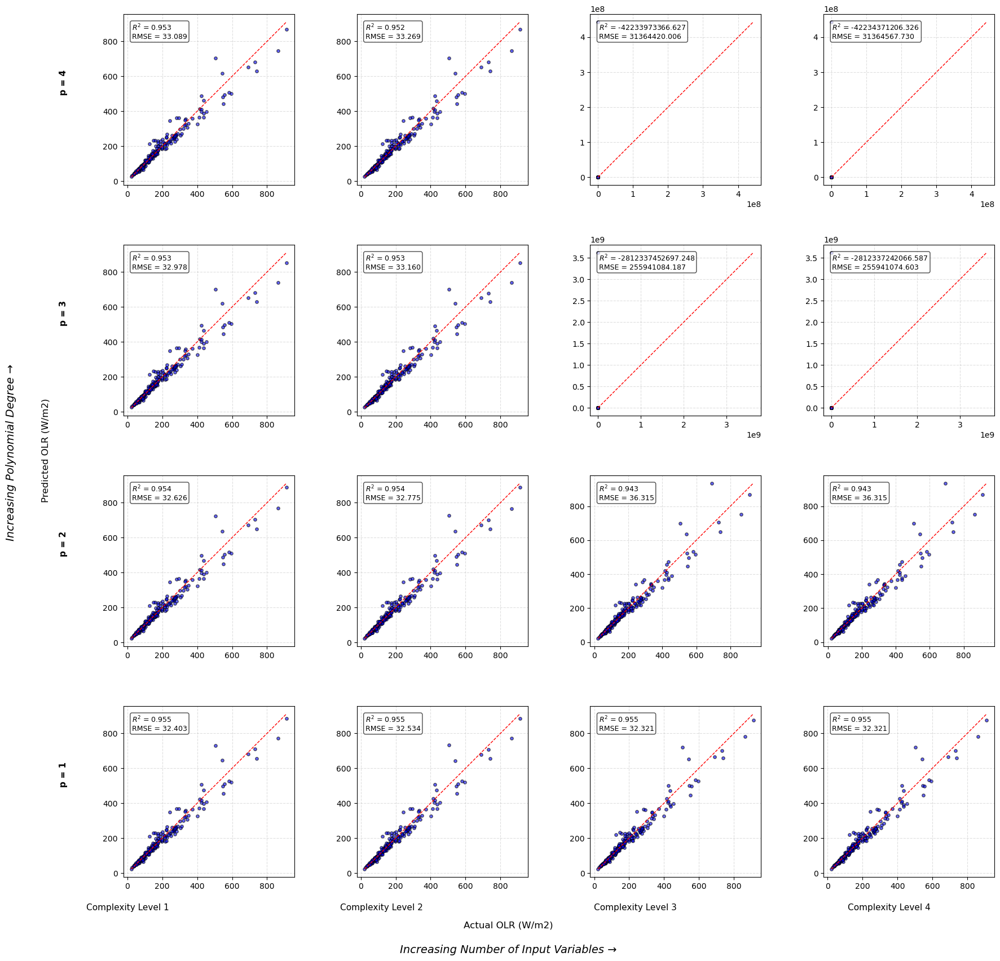

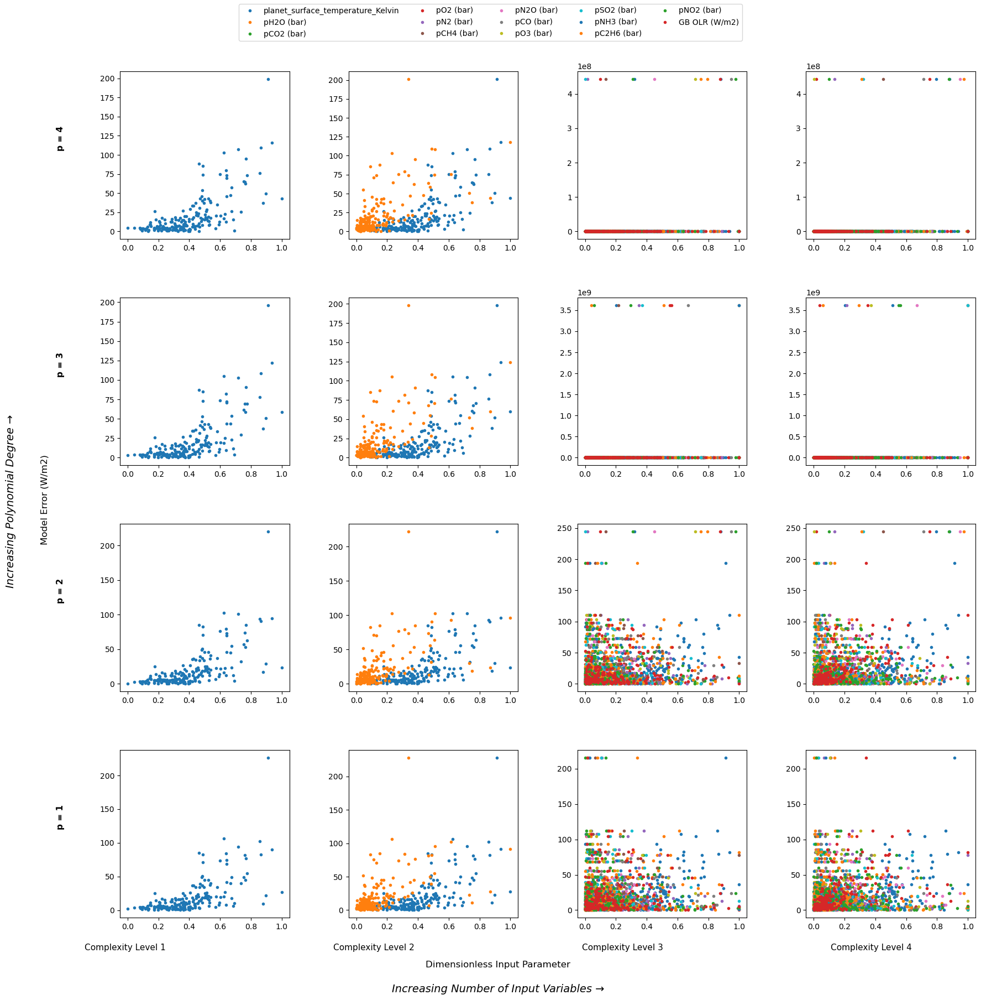

In [178]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        if i == 0:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                # ('linear', 'passthrough', ['BB OLR (W/m2)'])
            ]) 
        elif i >= 1 and i < 14:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset[:1] + X_subset[2:]),

                # log10 
                ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                # ('linear', 'passthrough', ['BB OLR (W/m2)'])
            ])             
        else:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset[:len(X_subset) - 1]),

                # log10 
                ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                # ('linear', 'passthrough', ['GB OLR (W/m2)'])
            ])                       
               
        # Linear Regression Model
        LR = Pipeline([
            ('features', transformer),
            ('regressor', LinearRegression())
        ])

        # Fitting the model to the data
        LR.fit(X_Train, Y_Train)

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)

        # Transforming predicted temperatures from LogT back to T
        Y_Valid_Pred = np.power(10,Y_Valid_Pred)

        Rsqr = r2_score(Y_Valid_T, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid_T, Y_Valid_Pred))

        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid_T,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid_T),
        'R²': Rsqr,
        'RMSE': RMSE
        })

# Plotting =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Polynomial Combinations and Logs", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Polynomial Combinations and Logs")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93,bottom=0.25, wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Dimensionless Input Parameter", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Model Error (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

### Just Logs

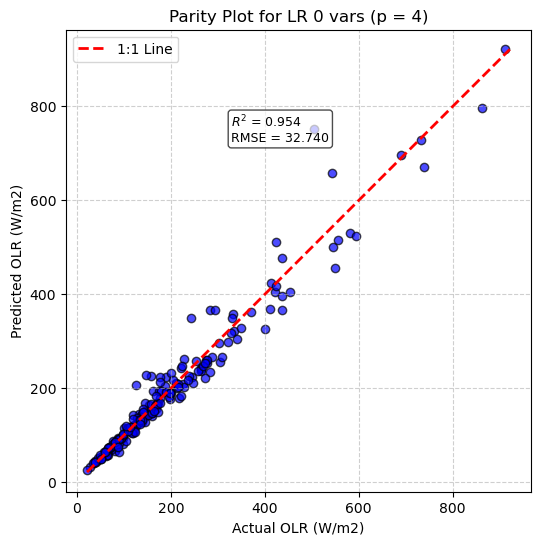

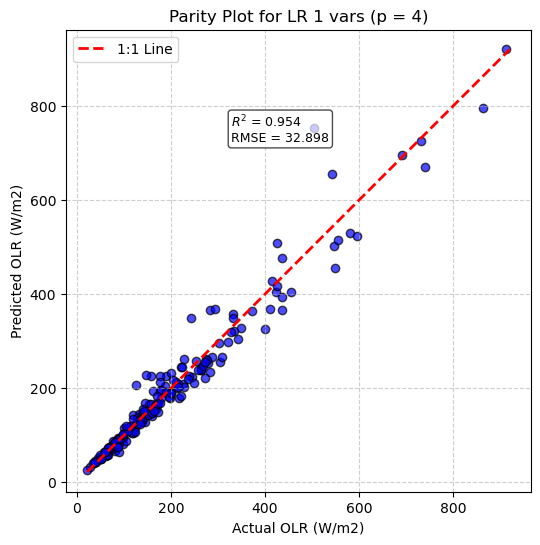

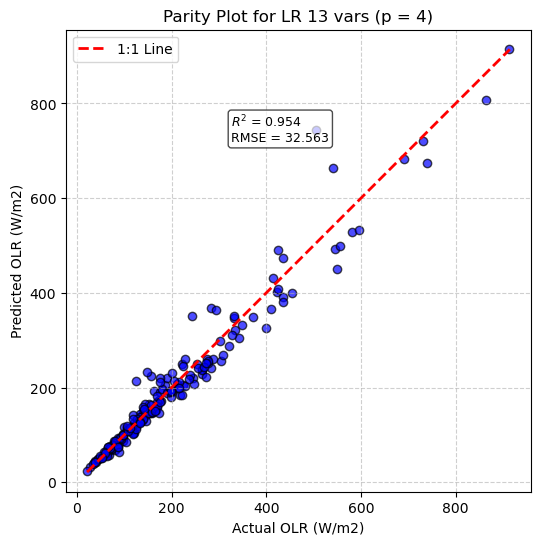

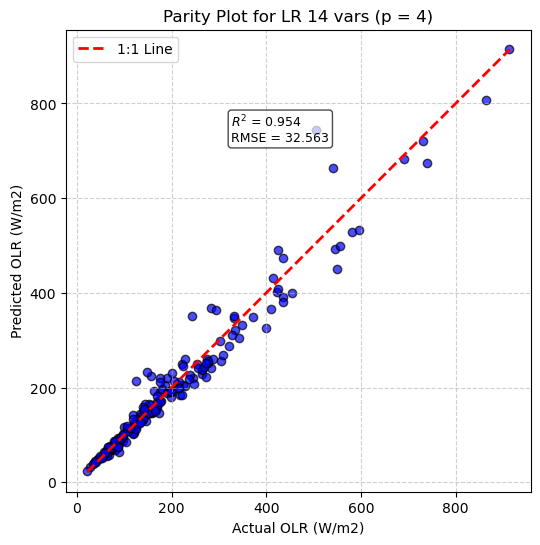

In [179]:
X_subset = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    LR_Results = []

    # Transformation of input
    if i == 0:
        transformer = ColumnTransformer([
            # Polynomial expansion
            # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

            # log10 
            ('log', FunctionTransformer(np.log10, validate= False), X_subset),

            # Don't transform
            # ('linear', 'passthrough', ['BB OLR (W/m2)'])
        ]) 
    elif i >= 1 and i < 14:
        transformer = ColumnTransformer([
            # Polynomial expansion
            # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

            # log10 
            ('log', FunctionTransformer(np.log10, validate= False), X_subset),

            # Don't transform
            #('linear', 'passthrough', ['BB OLR (W/m2)'])
        ])             
    else:
        transformer = ColumnTransformer([
            # Polynomial expansion
            # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

            # log10 
            ('log', FunctionTransformer(np.log10, validate= False), X_subset),

            # Don't transform
            #('linear', 'passthrough', ['GB OLR (W/m2)'])
        ])                       
            
    # Linear Regression Model
    LR = Pipeline([
        ('features', transformer),
        ('regressor', LinearRegression())
    ])

    # Fitting the model to the data
    LR.fit(X_Train, Y_Train)

    # Validating the model
    Y_Valid_Pred = LR.predict(X_Valid)

    # Transforming predicted temperatures from LogT back to T
    Y_Valid_Pred = np.power(10,Y_Valid_Pred)

    Rsqr = r2_score(Y_Valid_T, Y_Valid_Pred)
    RMSE = np.sqrt(mean_squared_error(Y_Valid_T, Y_Valid_Pred))

    LR_Results.append({
        'R²': Rsqr,
        'RMSE': RMSE
    })   

    plt.figure(figsize=(6,6))
    plt.scatter(Y_Valid_T, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.7)

    min_val = min(Y_Valid_Pred.min(), Y_Valid_T.min())
    max_val = max(Y_Valid_Pred.max(), Y_Valid_T.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='1:1 Line')
    plt.xlabel('Actual OLR (W/m2)')
    plt.ylabel('Predicted OLR (W/m2)')
    plt.title('Parity Plot for LR ' + str(i) + ' vars (p = ' + str(p) + ')')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.axis('equal')

    plt.text(
    0.05, 0.95,
    f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
    transform=ax.transAxes,
    fontsize=9,
    verticalalignment='top',
    bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    plt.show() 

### Just Polynomial Combinations

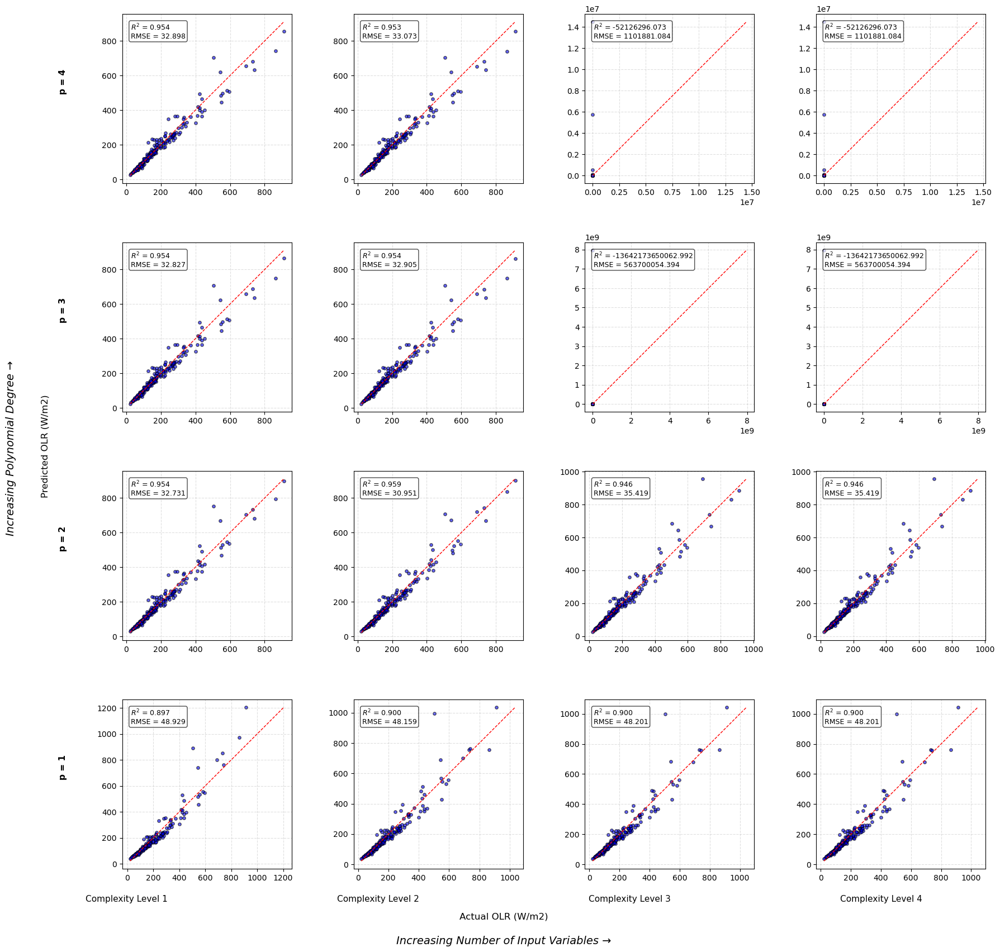

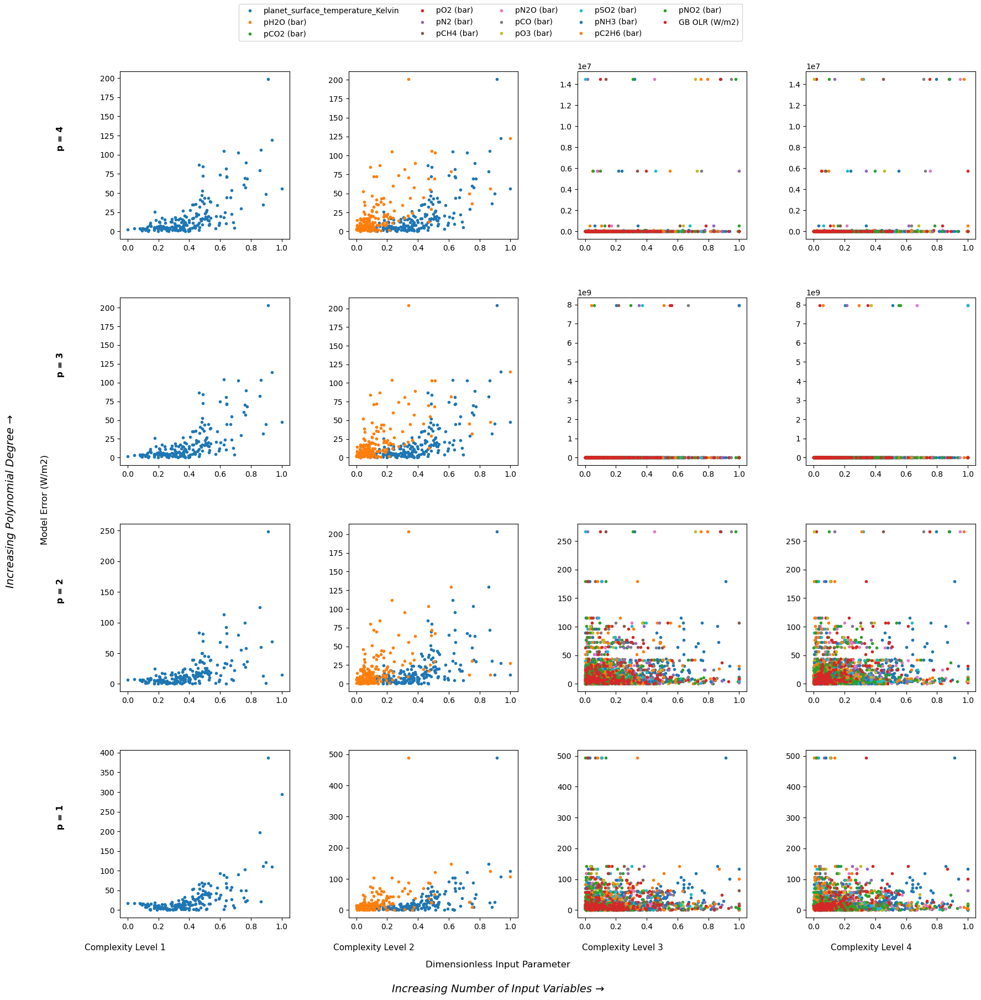

In [180]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    LR_Results = []

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        if i == 0:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                # ('linear', 'passthrough', ['BB OLR (W/m2)'])
            ]) 
        elif i >= 1 and i < 14:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset[:1] + X_subset[2:]),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                ('linear', 'passthrough', ['BB OLR (W/m2)'])
            ])             
        else:
            transformer = ColumnTransformer([
                # Polynomial expansion
                ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset[: len(X_subset) - 1]),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), X_subset),

                # Don't transform
                ('linear', 'passthrough', ['GB OLR (W/m2)'])
            ])                       
               
        # Linear Regression Model
        LR = Pipeline([
            ('features', transformer),
            ('regressor', LinearRegression())
        ])

        # Fitting the model to the data
        LR.fit(X_Train, Y_Train)

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)

        # Transforming predicted temperatures from LogT back to T
        Y_Valid_Pred = np.power(10,Y_Valid_Pred)
        
        Rsqr = r2_score(Y_Valid_T, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid_T, Y_Valid_Pred))

        LR_Results.append({
            'Degree': p,
            'R²': Rsqr,
            'RMSE': RMSE
        })   

        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid_T,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid_T),
        'R²': Rsqr,
        'RMSE': RMSE
        })

# Plotting =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Polynomial Combinations", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Just Polynomial Combinations")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93,bottom=0.25, wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Dimensionless Input Parameter", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Model Error (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

### Polynomial Combinations of Logs

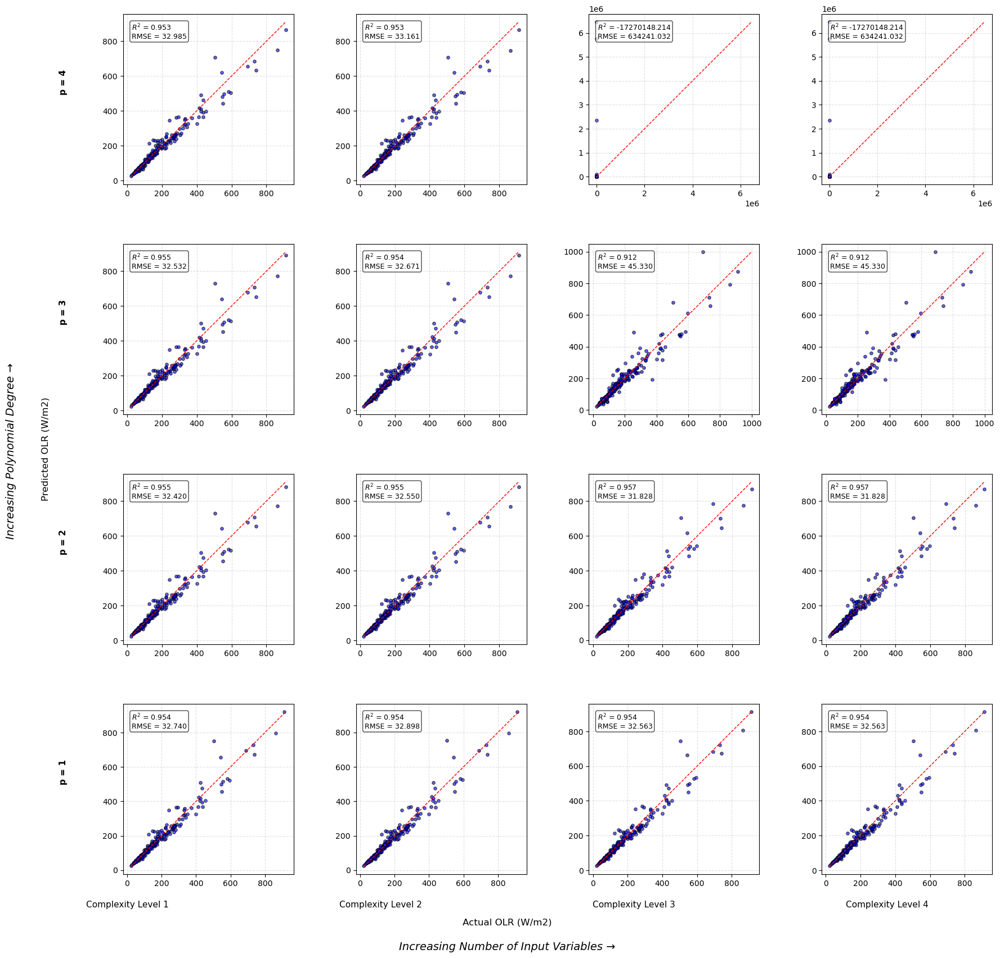

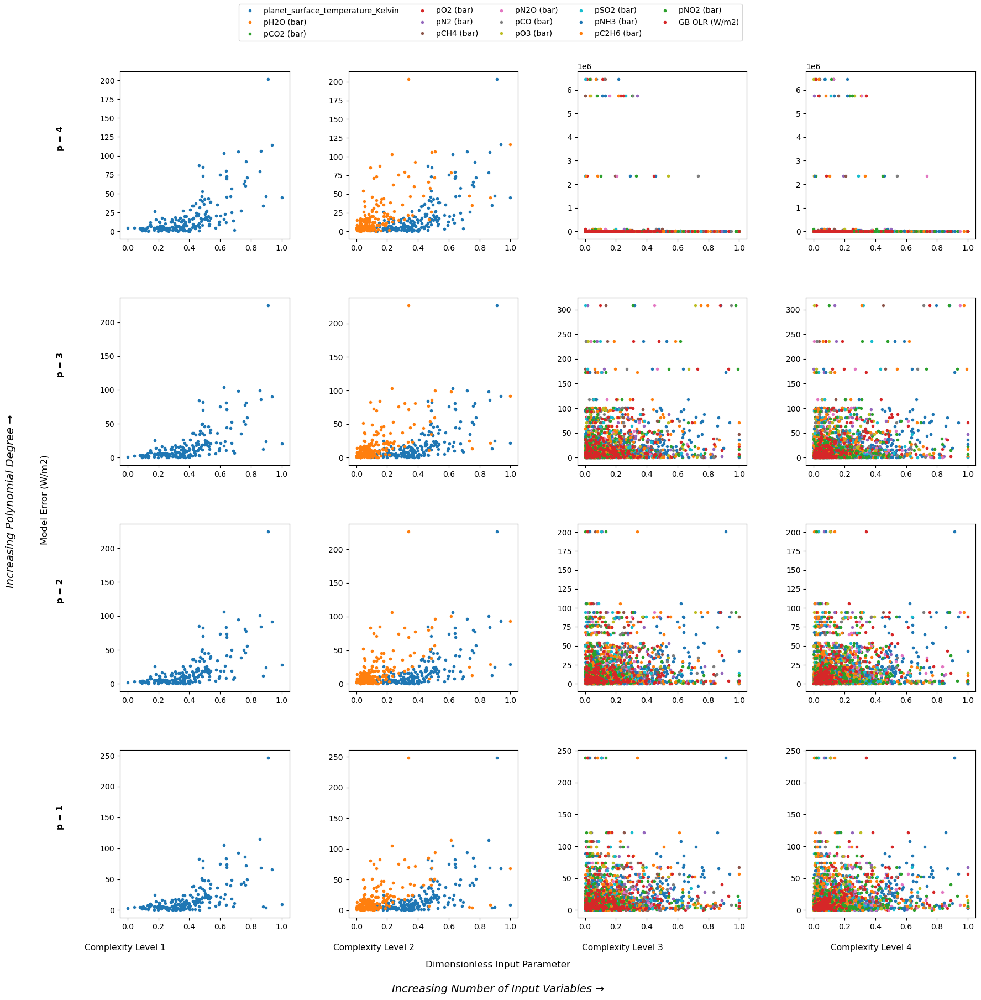

In [181]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    LR_Results = []

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        if i == 0:
            transformer = ColumnTransformer([
                # Polynomial expansion
                #('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), ['T_eff BB (K)']),

                # Don't transform
                # ('linear', 'passthrough', ['BB OLR (W/m2)']),

                # Polynomial expansion of logged variables
                ('PolyLog', Pipeline([
                    ('Log', FunctionTransformer(np.log10, validate = False)),
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False))
                ]), X_subset)
            ]) 
        elif i >= 1 and i < 14:
            transformer = ColumnTransformer([
                # Polynomial expansion
                # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                ('log', FunctionTransformer(np.log10, validate= False), ['BB OLR (W/m2)']),

                # Don't transform
                # ('linear', 'passthrough', ['T_eff BB (K)']),
                
                # Polynomial expansion of logged variables
                ('PolyLog', Pipeline([
                    ('Log', FunctionTransformer(np.log10, validate = False)),
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False))
                ]), X_subset[:1] + X_subset[2:])
            ])             
        else:
            transformer = ColumnTransformer([
                # Polynomial expansion
                # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                ('log', FunctionTransformer(np.log10, validate= False), ['GB OLR (W/m2)']),

                # Don't transform
                # ('linear', 'passthrough', ['T_eff GB (K)']),

                # Polynomial expansion of logged variables
                ('PolyLog', Pipeline([
                    ('Log', FunctionTransformer(np.log10, validate = False)),
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False))
                ]), X_subset[:len(X_subset) - 1])
            ])                       
               
        # Linear Regression Model
        LR = Pipeline([
            ('features', transformer),
            ('regressor', LinearRegression())
        ])

        # Fitting the model to the data
        LR.fit(X_Train, Y_Train)

        # Best model happens to be at i == 13 and p == 2
        # if i == 13 and p == 2:
        #    joblib.dump(LR, 'BestModel.pkl')

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)

        # Transforming predicted temperatures from LogT back to T
        Y_Valid_Pred = np.power(10,Y_Valid_Pred)

        Rsqr = r2_score(Y_Valid_T, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid_T, Y_Valid_Pred))

        LR_Results.append({
            'Degree': p,
            'R²': Rsqr,
            'RMSE': RMSE
        })   

        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid_T,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid_T),
        'R²': Rsqr,
        'RMSE': RMSE
        })

# Plotting =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Polynomial Combinations of Logs", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Polynomial Combinations of Logs")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93,bottom=0.25, wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Dimensionless Input Parameter", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Model Error (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

### Logs of Polynomial Combinations

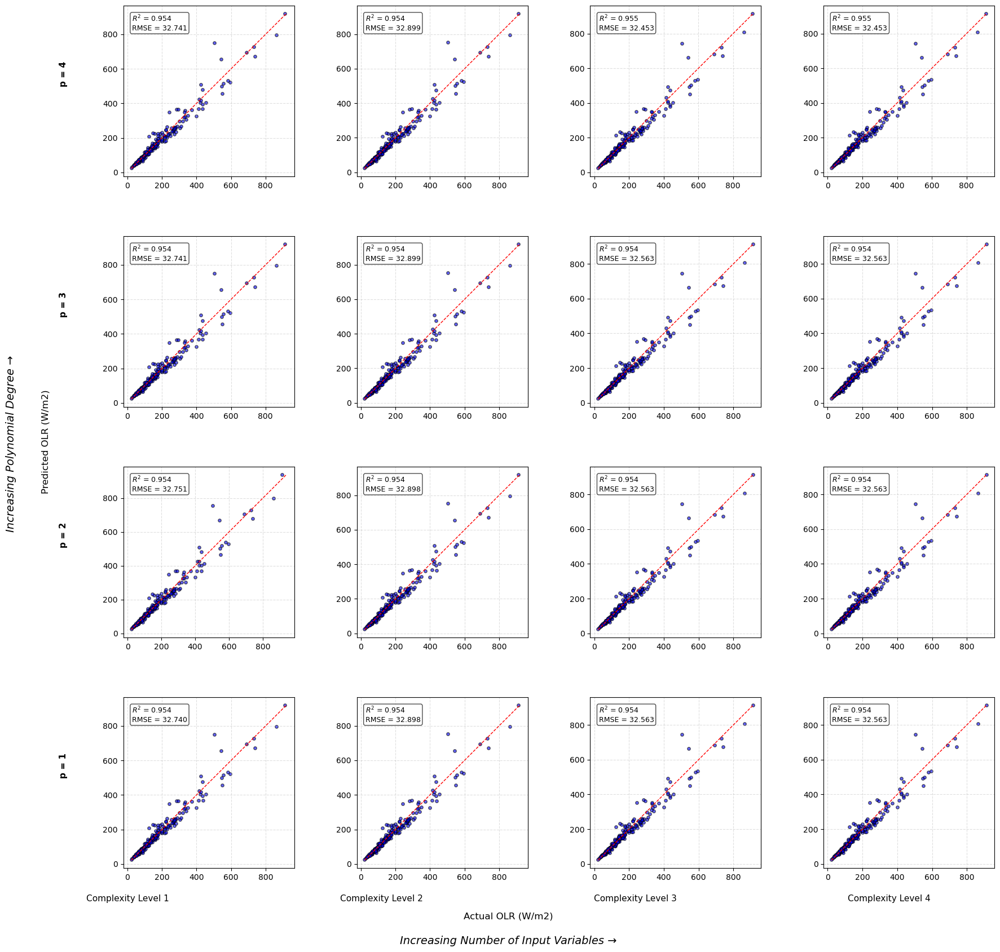

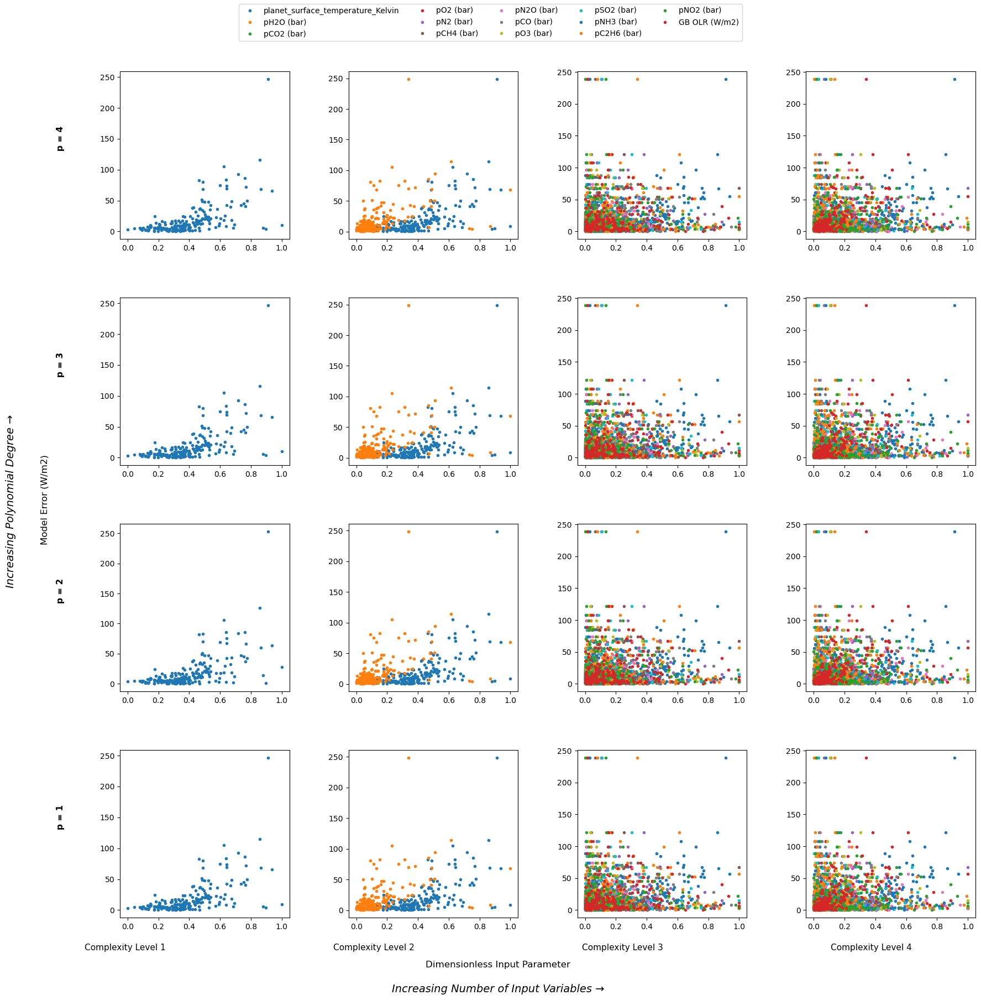

In [182]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    LR_Results = []

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        if i == 0:
            transformer = ColumnTransformer([
                # Polynomial expansion
                #('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                # ('log', FunctionTransformer(np.log10, validate= False), ['T_eff BB (K)']),

                # Don't transform
                # ('linear', 'passthrough', ['T_eff BB (K)']),

                # Logs of Polynomial Expansions
                ('LogPoly', Pipeline([
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False)),
                    ('Log', FunctionTransformer(np.log10, validate = False))
                ]), X_subset)
            ]) 
        elif i >= 1 and i < 14:
            transformer = ColumnTransformer([
                # Polynomial expansion
                # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                ('log', FunctionTransformer(np.log10, validate= False), ['BB OLR (W/m2)']),

                # Don't transform
                # ('linear', 'passthrough', ['T_eff BB (K)']),
                
                # Logs of Polynomial Expansions
                ('LogPoly', Pipeline([
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False)),
                    ('Log', FunctionTransformer(np.log10, validate = False))
                ]), X_subset[:1] + X_subset[2:])
            ])             
        else:
            transformer = ColumnTransformer([
                # Polynomial expansion
                # ('poly', PolynomialFeatures(degree= p, include_bias= False), X_subset),

                # log10 
                ('log', FunctionTransformer(np.log10, validate= False), ['GB OLR (W/m2)']),

                # Don't transform
                # ('linear', 'passthrough', ['T_eff GB (K)']),

                # Polynomial expansion of logged variables
                ('LogPoly', Pipeline([
                    ('Poly', PolynomialFeatures(degree = p, include_bias = False)),
                    ('Log', FunctionTransformer(np.log10, validate = False))
                ]), X_subset[:len(X_subset) - 1])
            ])                       
               
        # Linear Regression Model
        LR = Pipeline([
            ('features', transformer),
            ('regressor', LinearRegression())
        ])

        # Fitting the model to the data
        LR.fit(X_Train, Y_Train)

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)

        # Transforming predicted temperatures from LogT back to T
        Y_Valid_Pred = np.power(10,Y_Valid_Pred)

        Rsqr = r2_score(Y_Valid_T, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid_T, Y_Valid_Pred))

        LR_Results.append({
            'Degree': p,
            'R²': Rsqr,
            'RMSE': RMSE
        })   

        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid_T,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid_T),
        'R²': Rsqr,
        'RMSE': RMSE
        })


# Plotting =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Logs of Polynomial Combinations", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Logs of Polynomial Combinations")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93,bottom=0.25, wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Dimensionless Input Parameter", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Model Error (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

### Polynomial Combinations with Negative Powers

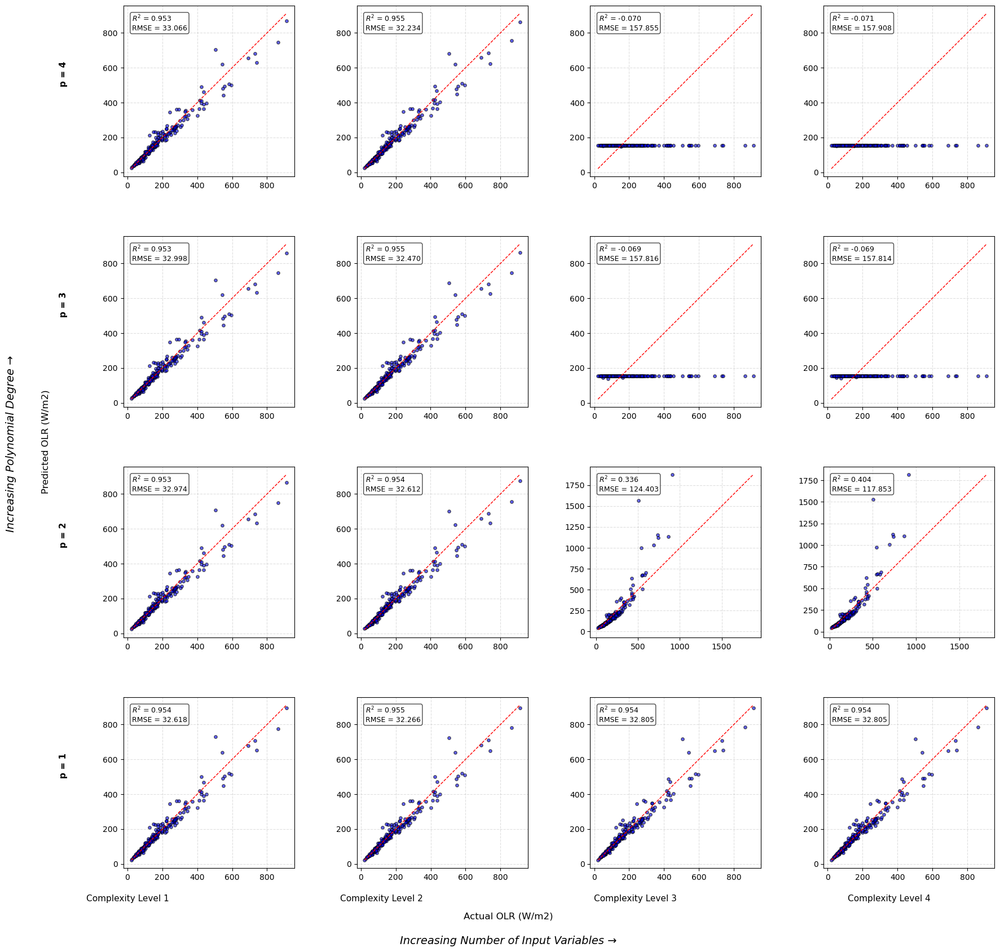

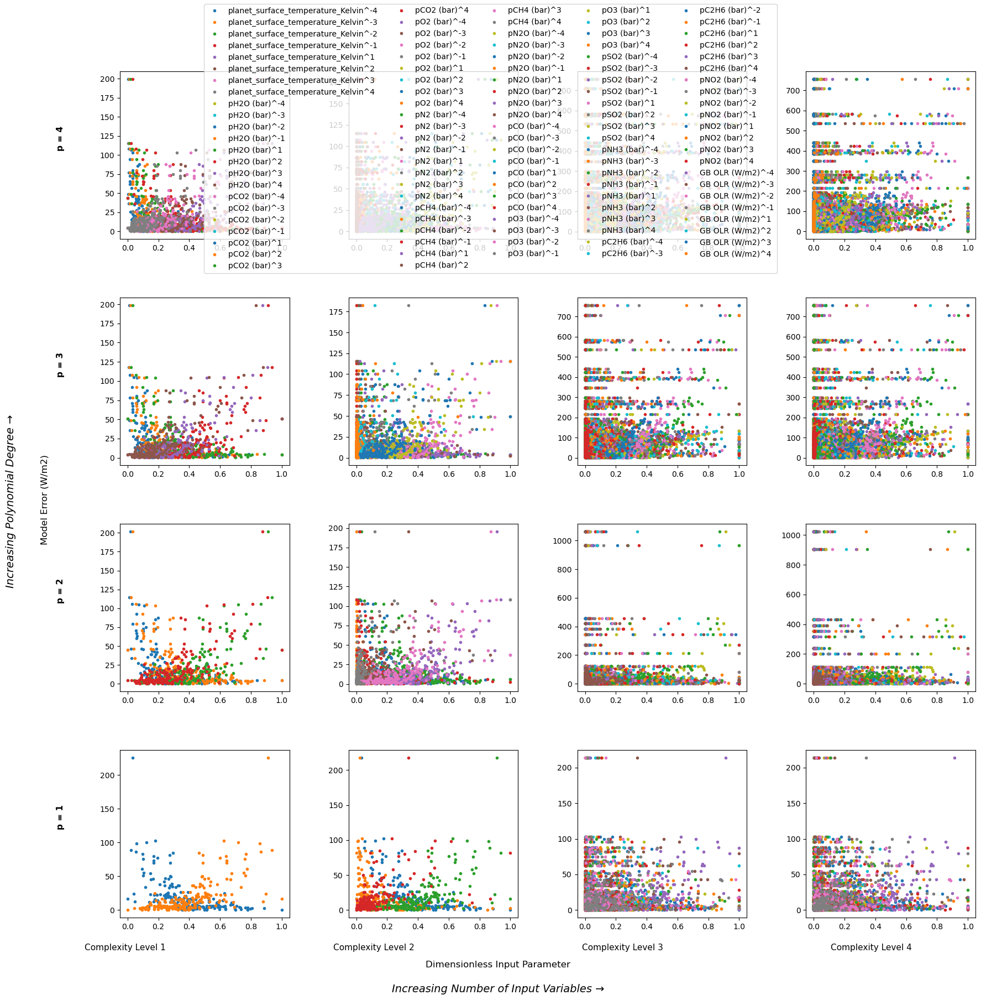

In [183]:
X_subset = []
plots_data = []

for i in range(0, len(X_vars), 1):  # This loop progressively makes the model more and more complex by adding more input variables. The input variables are added in order of easiest to obtain to hardest to obtain data for
    X_subset.append(X_vars[i])

    if i in range(2,13):    # All gasses are added to the model at the same time. Atmospheric compositions is retrieved all at once during atmospheric retrieval.
        continue

    if i == 14:
        X_subset.pop(1)
    
    X = df[X_subset]

    # Split data into training, validation
    # X_Train, X_Valid = train_test_split(X, test_size = 0.1, shuffle = False)

    LR_Results = []

    # Highest order of Polynomial to test
    for p in range(1, 4+1, 1):
        # Transformation of input
        temp_cols = [c for c in X.columns if "T_eff" in c]
        non_temp_cols = [c for c in X.columns if c not in temp_cols]

        X_transformed = pd.concat(
            [X[temp_cols]] + [X[non_temp_cols] ** k for k in range(-p, p + 1) if k != 0],
            axis=1
        )

        X_transformed.columns = (
            temp_cols + [f"{col}^{j}" for col in non_temp_cols for j in range(-p, p + 1) if j != 0]
        )

        X_Train, X_Valid = train_test_split(X_transformed, test_size= 0.1, shuffle= False)

        cols_to_drop = [col for col in X_Train.columns if "T_eff" in col and "^1" not in col]
        X_Train = X_Train.drop(columns=cols_to_drop)
        X_Valid = X_Valid.drop(columns=cols_to_drop)

        # Fitting the model to the data
        LR = LinearRegression().fit(X_Train, Y_Train)

        # Validating the model
        Y_Valid_Pred = LR.predict(X_Valid)
        Y_Valid_Pred = np.power(10, Y_Valid_Pred)
        Rsqr = r2_score(Y_Valid_T, Y_Valid_Pred)
        RMSE = np.sqrt(mean_squared_error(Y_Valid_T, Y_Valid_Pred))

        LR_Results.append({
            'Degree': p,
            'R²': Rsqr,
            'RMSE': RMSE
        })   

        plots_data.append({
        'i': i + 1,
        'p': p,
        'X_Valid': X_Valid,
        'Y_Valid': Y_Valid_T,
        'Y_Valid_Pred': Y_Valid_Pred,
        'Error': abs(Y_Valid_Pred - Y_Valid_T),
        'R²': Rsqr,
        'RMSE': RMSE
        })

# Plotting =================================================================================================================================================================================================
valid_i = [0, 1, 13, 14]
max_p = 4  

fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)

# Main title
# fig.suptitle("Parity Plots for Polynomial Combination with Negative Powers", fontsize=16, y=0.96)

col_labels = [
    "Complexity Level 1",
    "Complexity Level 2",
    "Complexity Level 3",
    "Complexity Level 4"
]

row_labels = [f"p = {p}" for p in range(max_p, 0, -1)]  

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue

    p = data['p']
    row = max_p - p
    col = valid_i.index(i)

    ax = axes[row, col]
    Y_Valid = data['Y_Valid']
    Y_Valid_Pred = data['Y_Valid_Pred']
    Rsqr = data['R²']
    RMSE = data['RMSE']

    # Scatter points
    ax.scatter(Y_Valid, Y_Valid_Pred, color='blue', edgecolor='k', alpha=0.6, s=15)

    # 1:1 parity line
    min_val = min(Y_Valid.min(), Y_Valid_Pred.min())
    max_val = max(Y_Valid.max(), Y_Valid_Pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1)

    # Stats textbox
    ax.text(
        0.05, 0.95,
        f"$R^2$ = {Rsqr:.3f}\nRMSE = {RMSE:.3f}",
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.7)
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_aspect('equal', 'box')

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Actual OLR (W/m2)", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Predicted OLR (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()

# 1D Error Profiles =================================================================================================================================================
fig, axes = plt.subplots(max_p, len(valid_i), figsize=(4.5*len(valid_i), 4.5*max_p), sharex=False, sharey=False)
# fig.suptitle("Error Profiles of Input Parameters for Polynomial Combinations with Negative Powers")

for data in plots_data:
    i = data['i'] - 1
    if i not in valid_i:
        continue
    p = data['p']
    row = max_p - p
    col = valid_i.index(i)
    ax = axes[row, col]


    X_Valid_Temp = data['X_Valid']
    Error = data['Error']

    X_Scaler = MinMaxScaler()
    X_Valid_S = pd.DataFrame(
    X_Scaler.fit_transform(X_Valid_Temp),
    columns=X_Valid_Temp.columns
    )

    for Feature in X_Valid_Temp.columns.tolist():
        ax.plot(X_Valid_S[Feature], Error, label = Feature, marker = '.', linestyle = 'None')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93,bottom=0.25, wspace=0.35, hspace=0.35)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=10)

for ax, row_label in zip(axes[:, 0], row_labels):
    ax.annotate(row_label, xy=(-0.35, 0.6), xycoords='axes fraction',
                rotation=90, ha='center', va='center', fontsize=11, fontweight='bold')

fig.text(0.5, 0.03, "Dimensionless Input Parameter", ha='center', fontsize=12)
fig.text(0.04, 0.5, "Model Error (W/m2)", va='center', rotation='vertical', fontsize=12)

fig.text(0.5, 0.005, "Increasing Number of Input Variables →", ha='center', fontsize=14, style='italic')
fig.text(0.005, 0.5, "Increasing Polynomial Degree → ", va='center', rotation='vertical', fontsize=14, style='italic')

fig.subplots_adjust(left=0.12, right=0.98, top=0.93, bottom=0.08, wspace=0.35, hspace=0.35)

for j, label in enumerate(col_labels):
    fig.text(
        (j + 0.5) / len(valid_i),   
        0.05,                      
        label,
        ha='center', va='center',
        fontsize=11
    )

plt.show()